# Combined and per-module PCA geometry comparison

Compares a **fixed set** of two-module RNN runs: **nb_steps=2**, 25 units per module, **task_routed vs shared** input, across **all sparsity levels** (no_comms, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0). Only runs with existing simulation folders are included.

For each run we plot:
- **Combined** hidden-state PCA geometry (post-A, post-B, post-A2): 2D PCA on concatenated (12, 50) hiddens with hexagon plots.
- **Per-module** PCA geometry: 2D PCA on module 0 (12, 25) and module 1 (12, 25) separately, same hexagon visualization.
- **Number of PCA components** (combined and per-module) for 90% and 95% variance.
- **Cumulative explained variance** vs component index.

## 1. Setup and paths

In [1]:
import sys
import os
import json
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

project_root = Path(os.getcwd()).resolve()
while not (project_root / "a1b2").exists():
    if project_root == project_root.parent:
        raise RuntimeError("Project root (containing a1b2) not found.")
    project_root = project_root.parent
sys.path.insert(0, str(project_root))
os.chdir(project_root)

from a1b2.utils.run_config import build_run_id
from a1b2.analysis import transfer_interference as ann
from a1b2.utils.figure_settings import condition_order, task_colours, cm_conv
from a1b2.utils.figure_utils import plot_split_stim, get_axis_limits

data_folder = project_root / "data"
sim_folder = data_folder / "simulations"
config_path = project_root / "a1b2" / "models" / "experiments.json"
with open(config_path, "r") as f:
    settings = json.load(f)

print("Project root:", project_root)
print("Simulations folder:", sim_folder)

Project root: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular
Simulations folder: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular/data/simulations


## 2. Run selection (shared/task_routed × all sparsity levels, including no_comms)

Filter conditions: two_module_rnn, dim_hidden=25, nb_steps=2, common_readout. Keep shared and task_routed with **any** sparsity (0 = no_comms, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0). Only include runs whose simulation folder exists.

In [2]:
SPARSITIES = [0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
ROUTINGS = ["shared", "task_routed"]

def want_condition(c):
    if c.get("arch") != "two_module_rnn":
        return False
    if c.get("dim_hidden") != 25:
        return False
    if c.get("nb_steps", 1) != 2:
        return False
    if c.get("common_readout", True) is not True:
        return False
    routing = c.get("input_routing", "shared")
    sp = c.get("sparsity", 1.0)
    return routing in ROUTINGS and sp in SPARSITIES

selected_conditions = [c for c in settings["conditions"] if want_condition(c)]
run_ids_with_paths = []
for c in selected_conditions:
    run_id = build_run_id(c)
    path = sim_folder / run_id
    if path.exists():
        run_ids_with_paths.append((run_id, path))
    else:
        run_ids_with_paths.append((run_id, None))

def display_label(run_id):
    routing = "tr" if "task_routed" in run_id else "sh"
    parts = run_id.split("_")
    sp = next((p for p in parts if p.startswith("sp")), "")
    if sp == "sp1.0":
        sp = "sp1"
    if "no_comms" in run_id or sp == "sp0":
        sp = "no_comms"
    return f"h25 nb2 {routing} {sp}"

print("Selected runs (existing path only):")
for run_id, path in run_ids_with_paths:
    status = "OK" if path else "missing"
    print(f"  {display_label(run_id)}: {run_id} [{status}]")

Selected runs (existing path only):
  h25 nb2 sh sp1: two_module_rnn_25_nb2_nb2_shared_sp1.0_sep_cr_RNN [OK]
  h25 nb2 sh sparse: two_module_rnn_25_low_sparse_nb2_nb2_shared_sp0.3_sep_cr_RNN [OK]
  h25 nb2 tr sp1: two_module_rnn_25_task_routed_nb2_nb2_task_routed_sp1_sep_cr_RNN [OK]
  h25 nb2 tr sparse: two_module_rnn_25_task_routed_low_sparse_nb2_nb2_task_routed_sp0.3_sep_cr_RNN [OK]
  h25 nb2 sh sp05: two_module_rnn_25_sp05_nb2_nb2_shared_sp0.5_sep_cr_RNN [OK]
  h25 nb2 sh sp07: two_module_rnn_25_sp07_nb2_nb2_shared_sp0.7_sep_cr_RNN [OK]
  h25 nb2 tr sp05: two_module_rnn_25_task_routed_sp05_nb2_nb2_task_routed_sp0.5_sep_cr_RNN [OK]
  h25 nb2 tr sp07: two_module_rnn_25_task_routed_sp07_nb2_nb2_task_routed_sp0.7_sep_cr_RNN [OK]
  h25 nb2 sh sp01: two_module_rnn_25_sp01_nb2_nb2_shared_sp0.1_sep_cr_RNN [OK]
  h25 nb2 tr sp01: two_module_rnn_25_task_routed_sp01_nb2_nb2_task_routed_sp0.1_sep_cr_RNN [OK]
  h25 nb2 sh sp09: two_module_rnn_25_sp09_nb2_nb2_shared_sp0.9_sep_cr_RNN [OK]
  h25 nb

## 3. Load data

Load ANN data with load_rnn_extra=True so we get hiddens_post_phase_*_per_module (12, 2, 25) for each participant. Use first participant per schedule when plotting.

In [3]:
all_ann_data = {}
for run_id, path in run_ids_with_paths:
    if path is None:
        continue
    ann_data = ann.load_ann_data(str(path), load_rnn_extra=True)
    if len(ann_data["same"]) > 0 and len(ann_data["near"]) > 0 and len(ann_data["far"]) > 0:
        all_ann_data[run_id] = ann_data

run_labels = [run_id for run_id, path in run_ids_with_paths if run_id in all_ann_data]
R = len(run_labels)
schedules = condition_order
schedule_to_idx = {"same": 0, "near": 1, "far": 2}

print("Loaded", R, "runs with all three schedules.")
for rid in run_labels:
    d = all_ann_data[rid]
    print(f"  {display_label(rid)}: same={len(d['same'])} near={len(d['near'])} far={len(d['far'])}")

Loaded 14 runs with all three schedules.
  h25 nb2 sh sp1: same=103 near=101 far=101
  h25 nb2 sh sparse: same=103 near=101 far=101
  h25 nb2 tr sp1: same=103 near=101 far=101
  h25 nb2 tr sparse: same=103 near=101 far=101
  h25 nb2 sh sp05: same=103 near=101 far=101
  h25 nb2 sh sp07: same=99 near=97 far=97
  h25 nb2 tr sp05: same=103 near=101 far=101
  h25 nb2 tr sp07: same=96 near=95 far=91
  h25 nb2 sh sp01: same=103 near=101 far=101
  h25 nb2 tr sp01: same=103 near=101 far=101
  h25 nb2 sh sp09: same=103 near=101 far=101
  h25 nb2 tr sp09: same=103 near=101 far=101
  h25 nb2 sh no_comms: same=103 near=101 far=101
  h25 nb2 tr no_comms: same=103 near=101 far=101


## 4. Helpers: get_hiddens_12 for combined and per-module

get_hiddens_12(h, sched) returns (12, D) for combined; for per-module we use h_per (12, 2, 25) and slice by module.

In [4]:
def get_hiddens_12(h, sched):
    if h is None or not hasattr(h, "shape"):
        return None
    if h.ndim == 3 and h.shape[0] == 3 and h.shape[1] >= 12:
        return h[schedule_to_idx[sched], :12, :].copy()
    if h.ndim == 2 and len(h) >= 12:
        return h[:12, :].copy()
    return None

def get_hiddens_12_per_module(h_per, sched):
    if h_per is None or not hasattr(h_per, "shape"):
        return None
    if h_per.ndim == 4 and h_per.shape[0] == 3 and h_per.shape[1] >= 12:
        return h_per[schedule_to_idx[sched], :12, :, :].copy()
    if h_per.ndim == 3 and h_per.shape[0] >= 12 and h_per.shape[1] == 2:
        return h_per[:12, :, :].copy()
    return None

## 5. Combined PCA geometry (post-A, post-B, post-A2)

One subplot per (run x schedule x phase). Uses first participant per schedule. PCA on (12, 50), then plot_split_stim hexagons.

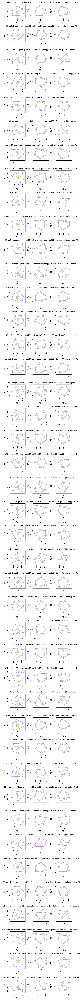

In [5]:
phases = [
    ("hiddens_post_phase_0", "post-A"),
    ("hiddens_post_phase_1", "post-B"),
    ("hiddens_post_phase_2", "post-A2"),
]
subj = 0
ncols = len(phases)
nrows = R * len(schedules)

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4 * cm_conv, nrows * 4 * cm_conv), squeeze=False)
for r, run_id in enumerate(run_labels):
    data = all_ann_data[run_id]
    for s, sched in enumerate(schedules):
        row = r * len(schedules) + s
        schedule_data = data[sched]
        if subj >= len(schedule_data):
            for col in range(ncols):
                axes[row, col].set_visible(False)
            continue
        for col, (phase_key, phase_name) in enumerate(phases):
            ax = axes[row, col]
            h = schedule_data[subj].get(phase_key)
            h12 = get_hiddens_12(h, sched)
            if h12 is None:
                ax.set_visible(False)
                continue
            pca, transformed = ann.prepare_pca_single_task(h12)
            lims = get_axis_limits(transformed)
            plot_split_stim(ax, transformed, task_colours, lims)
            ax.set_title(f"{display_label(run_id)} | {sched} | {phase_name}")
plt.tight_layout()
plt.show()

## 6. Per-module PCA geometry

For each run/schedule/phase: three panels — combined, M0, M1. If hiddens_post_phase_*_per_module is missing, show placeholder.

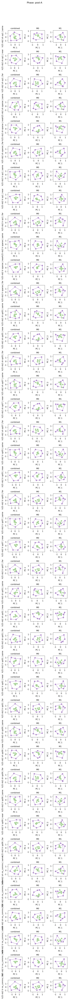

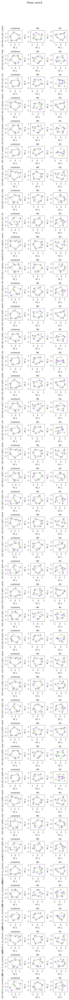

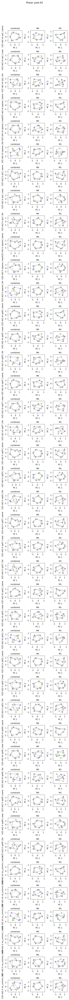

In [6]:
phase_keys_per_module = [
    "hiddens_post_phase_0_per_module",
    "hiddens_post_phase_1_per_module",
    "hiddens_post_phase_2_per_module",
]
phase_names = ["post-A", "post-B", "post-A2"]
ncols_block = 3

for phase_idx, (phase_key, phase_key_per, phase_name) in enumerate(zip(
    [p[0] for p in phases], phase_keys_per_module, phase_names
)):
    nrows_phase = R * len(schedules)
    fig, axes = plt.subplots(
        nrows_phase, ncols_block,
        figsize=(ncols_block * 3.5 * cm_conv, nrows_phase * 3.5 * cm_conv),
        squeeze=False,
    )
    for r, run_id in enumerate(run_labels):
        data = all_ann_data[run_id]
        for s, sched in enumerate(schedules):
            row = r * len(schedules) + s
            schedule_data = data[sched]
            if subj >= len(schedule_data):
                for c in range(ncols_block):
                    axes[row, c].set_visible(False)
                continue
            part = schedule_data[subj]
            h = part.get(phase_key)
            h12 = get_hiddens_12(h, sched)
            h_per = part.get(phase_key_per)
            h12_per = get_hiddens_12_per_module(h_per, sched) if h_per is not None else None

            ax_comb = axes[row, 0]
            if h12 is not None:
                pca, transformed = ann.prepare_pca_single_task(h12)
                lims = get_axis_limits(transformed)
                plot_split_stim(ax_comb, transformed, task_colours, lims)
            ax_comb.set_title("combined")

            if h12_per is not None:
                h_m0 = h12_per[:, 0, :]
                h_m1 = h12_per[:, 1, :]
                for mod_idx, (h_mi, ax_m) in enumerate(zip([h_m0, h_m1], [axes[row, 1], axes[row, 2]])):
                    pca_m, trans_m = ann.prepare_pca_single_task(h_mi)
                    lims_m = get_axis_limits(trans_m)
                    plot_split_stim(ax_m, trans_m, task_colours, lims_m)
                    ax_m.set_title(f"M{mod_idx}")
            else:
                for c in range(1, ncols_block):
                    axes[row, c].text(0.5, 0.5, "no per-module data", ha="center", va="center", transform=axes[row, c].transAxes)
                    axes[row, c].set_title("M0" if c == 1 else "M1")

            axes[row, 0].set_ylabel(f"{display_label(run_id)} | {sched}")
    fig.suptitle(f"Phase: {phase_name}", y=1.02)
    plt.tight_layout()
    plt.show()

## 7. Number of PCA components (combined and per-module)

For each run, schedule, and phase we fit PCA and compute **how many components** are needed to explain 90% and 95% of the variance. Done for **combined** 12-stimulus hiddens and for **each module** (M0, M1) when per-module data is available. Lower values indicate more low-dimensional representations.

/tmp/ipykernel_858316/1244664581.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
/tmp/ipykernel_858316/1244664581.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")


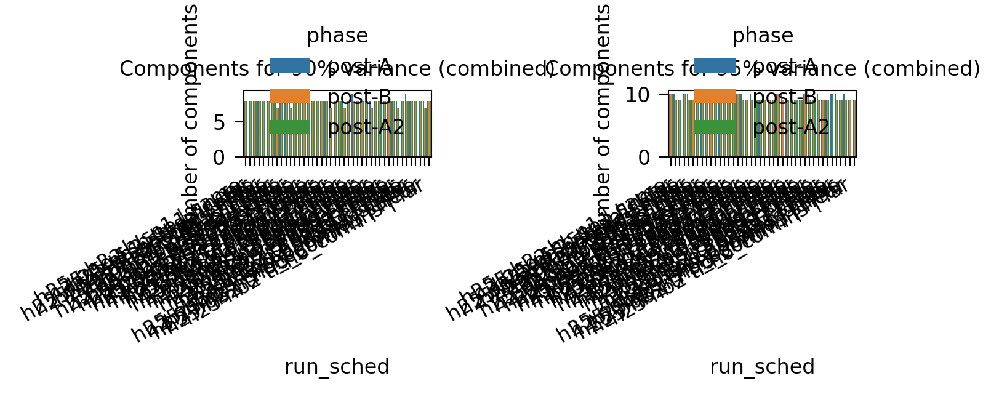

/tmp/ipykernel_858316/1244664581.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
/tmp/ipykernel_858316/1244664581.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
/tmp/ipykernel_858316/1244664581.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
/tmp/ipykernel_858316/1244664581.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")


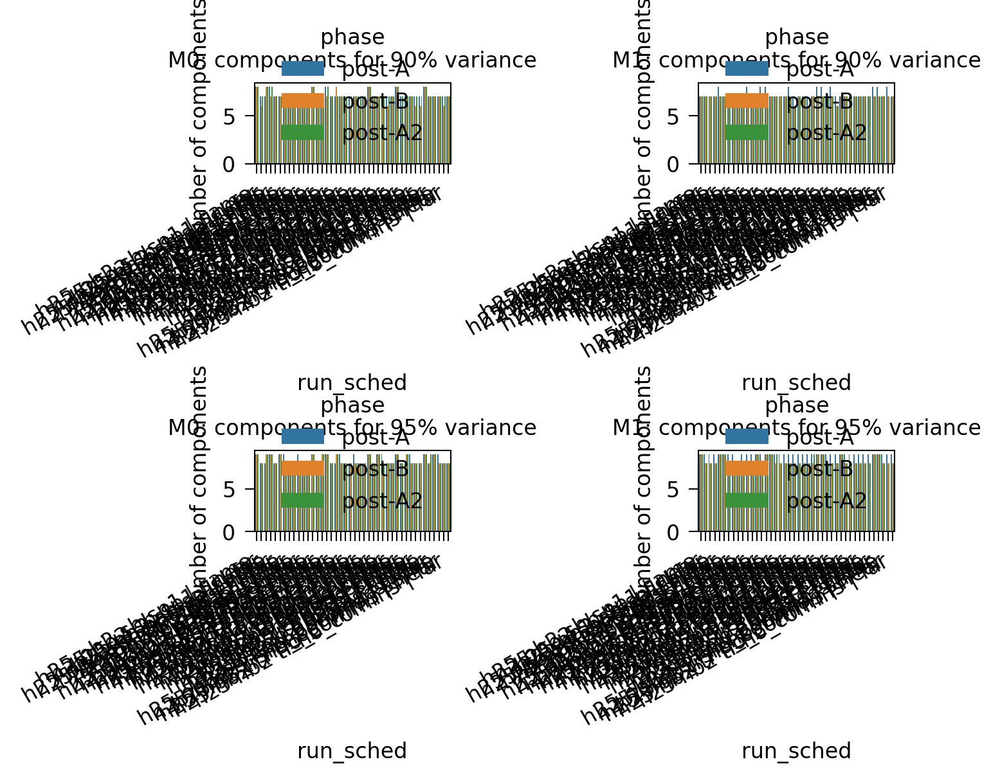

In [7]:
from sklearn.decomposition import PCA
import pandas as pd

VARIANCE_THRESHOLDS = [0.90, 0.95]
subj = 0
phases_list = [
    ("hiddens_post_phase_0", "post-A"),
    ("hiddens_post_phase_1", "post-B"),
    ("hiddens_post_phase_2", "post-A2"),
]

n_components_rows = []
for run_id in run_labels:
    data = all_ann_data[run_id]
    for sched in schedules:
        schedule_data = data[sched]
        if subj >= len(schedule_data):
            continue
        for phase_key, phase_name in phases_list:
            h = schedule_data[subj].get(phase_key)
            h12 = get_hiddens_12(h, sched)
            if h12 is None or h12.shape[0] < 2:
                continue
            n_samples, n_features = h12.shape
            n_comp_max = min(n_samples, n_features)
            pca = PCA(n_components=n_comp_max).fit(h12)
            cumvar = np.cumsum(pca.explained_variance_ratio_)
            for thresh in VARIANCE_THRESHOLDS:
                n_need = np.searchsorted(cumvar, thresh) + 1
                if n_need > len(cumvar):
                    n_need = len(cumvar)
                n_components_rows.append({
                    "run": display_label(run_id),
                    "schedule": sched,
                    "phase": phase_name,
                    "variance_threshold": thresh,
                    "n_components": n_need,
                })

df_n_components = pd.DataFrame(n_components_rows)

fig, axes = plt.subplots(1, len(VARIANCE_THRESHOLDS), figsize=(6 * len(VARIANCE_THRESHOLDS) * cm_conv, 5 * cm_conv), squeeze=False)
for idx, thresh in enumerate(VARIANCE_THRESHOLDS):
    ax = axes[0, idx]
    df_t = df_n_components[df_n_components["variance_threshold"] == thresh].copy()
    df_t["run_sched"] = df_t["run"] + " | " + df_t["schedule"]
    import seaborn as sns
    sns.barplot(data=df_t, x="run_sched", y="n_components", hue="phase", ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
    ax.set_ylabel("Number of components")
    ax.set_title(f"Components for {int(thresh*100)}% variance (combined)")
    ax.set_ylim(0, None)
plt.tight_layout()
plt.show()

# Per-module: n_components for M0 and M1 when per_module data is available
phase_keys_per_module = [
    "hiddens_post_phase_0_per_module",
    "hiddens_post_phase_1_per_module",
    "hiddens_post_phase_2_per_module",
]
n_components_per_module = []
for run_id in run_labels:
    data = all_ann_data[run_id]
    for sched in schedules:
        schedule_data = data[sched]
        if subj >= len(schedule_data):
            continue
        for (phase_key_per, phase_name) in zip(phase_keys_per_module, [p[1] for p in phases_list]):
            h_per = schedule_data[subj].get(phase_key_per)
            h12_per = get_hiddens_12_per_module(h_per, sched) if h_per is not None else None
            if h12_per is None:
                continue
            for mod_idx, mod_name in enumerate(["M0", "M1"]):
                h_mi = h12_per[:, mod_idx, :]
                if h_mi.shape[0] < 2 or h_mi.shape[1] < 2:
                    continue
                n_comp_max = min(h_mi.shape[0], h_mi.shape[1])
                pca = PCA(n_components=n_comp_max).fit(h_mi)
                cumvar = np.cumsum(pca.explained_variance_ratio_)
                for thresh in VARIANCE_THRESHOLDS:
                    n_need = np.searchsorted(cumvar, thresh) + 1
                    if n_need > len(cumvar):
                        n_need = len(cumvar)
                    n_components_per_module.append({
                        "run": display_label(run_id),
                        "schedule": sched,
                        "phase": phase_name,
                        "module": mod_name,
                        "variance_threshold": thresh,
                        "n_components": n_need,
                    })

if n_components_per_module:
    df_per_mod = pd.DataFrame(n_components_per_module)
    fig2, axes2 = plt.subplots(len(VARIANCE_THRESHOLDS), 2, figsize=(6 * 2 * cm_conv, 5 * len(VARIANCE_THRESHOLDS) * cm_conv), squeeze=False)
    for idx, thresh in enumerate(VARIANCE_THRESHOLDS):
        for mod_col, mod_name in enumerate(["M0", "M1"]):
            ax = axes2[idx, mod_col]
            df_t = df_per_mod[(df_per_mod["variance_threshold"] == thresh) & (df_per_mod["module"] == mod_name)].copy()
            if df_t.empty:
                ax.set_visible(False)
                continue
            df_t["run_sched"] = df_t["run"] + " | " + df_t["schedule"]
            sns.barplot(data=df_t, x="run_sched", y="n_components", hue="phase", ax=ax)
            ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
            ax.set_ylabel("Number of components")
            ax.set_title(f"{mod_name}: components for {int(thresh*100)}% variance")
            ax.set_ylim(0, None)
    plt.tight_layout()
    plt.show()
else:
    print("No per-module hidden data found; skip per-module n_components plot.")

## 8. Explained variance: cumulative and per-component

Cumulative explained variance vs component index (combined hiddens, first participant). Shows how quickly variance is captured; flat curve after few components indicates low-dimensional structure.

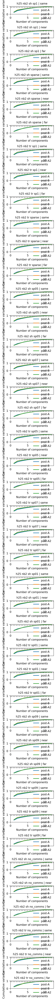

In [8]:
subj = 0
phases_list = [
    ("hiddens_post_phase_0", "post-A"),
    ("hiddens_post_phase_1", "post-B"),
    ("hiddens_post_phase_2", "post-A2"),
]
phase_colours = ["#1f77b4", "#ff7f0e", "#2ca02c"]

nrows = R * len(schedules)
fig, axes = plt.subplots(nrows, 1, figsize=(6 * cm_conv, 2.5 * nrows * cm_conv), squeeze=False)
axes = axes[:, 0]
row = 0
for run_id in run_labels:
    data = all_ann_data[run_id]
    for sched in schedules:
        ax = axes[row]
        schedule_data = data[sched]
        if subj >= len(schedule_data):
            ax.set_visible(False)
            row += 1
            continue
        for (phase_key, phase_name), col in zip(phases_list, phase_colours):
            h = schedule_data[subj].get(phase_key)
            h12 = get_hiddens_12(h, sched)
            if h12 is None or h12.shape[0] < 2:
                continue
            n_comp_max = min(h12.shape[0], h12.shape[1])
            pca = PCA(n_components=n_comp_max).fit(h12)
            cumvar = np.cumsum(pca.explained_variance_ratio_)
            ax.plot(np.arange(1, len(cumvar) + 1), cumvar, label=phase_name, color=col)
        ax.axhline(0.9, color="gray", linestyle="--", alpha=0.7)
        ax.axhline(0.95, color="gray", linestyle=":", alpha=0.7)
        ax.set_xlabel("Number of components")
        ax.set_ylabel("Cumulative variance")
        ax.set_title(f"{display_label(run_id)} | {sched}")
        ax.legend()
        ax.set_ylim(0, 1.02)
        ax.set_xlim(0, None)
        row += 1
plt.tight_layout()
plt.show()

## 9. Interpretation (optional)

When M0 vs M1 geometry diverges (e.g. one module shows a clear A/B separation and the other is collapsed), the combined view is dominated by the more structured module. When both modules show similar geometry, the combined PCA reflects shared structure. Per-module plots help separate contributions of each module to the overall representation. **Number of components** (sections 7–8): fewer components needed to reach 90–95% variance indicates more low-dimensional coding; cumulative variance curves show how quickly the representation is captured in few dimensions.